In [6]:
import sys, os
import plotly.io as pio 
import polars as pl 
import plotly.express as px
from cleaning import (describe_objects, count_missing)
import pandas as pd
import plotly.graph_objects as go
from visualisations import bar_plot, proportion_plot, boxplot_by_bin_with_target

# Path needs to be added manually to read from another folder
path2add = os.path.normpath(os.path.abspath(os.path.join(os.path.dirname('__file__'), os.path.pardir, 'utils')))
if (not (path2add in sys.path)) :
    sys.path.append(path2add)


In [4]:
data = pl.read_parquet("../data/supervised_clean_data.parquet")
print(data.shape)
data.head()

(9240, 33)


Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Country,Specialization,How did you hear about X Education,What is your current occupation,What matters most to you in choosing a course,Search,Magazine,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,Receive More Updates About Our Courses,Tags,Lead Quality,Update me on Supply Chain Content,Get updates on DM Content,Lead Profile,City,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity
str,i64,str,str,str,str,i64,f64,i64,f64,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str,str
"""7927b2df-8bba-4d29-b9a2-b6e0be…",660737,"""API""","""Olark Chat""","""No""","""No""",0,0.0,0,0.0,"""Page Visited on Website""","""India""","""Unknown""","""Unknown""","""Unemployed""","""Better Career Prospects""","""No""","""No""","""No""","""No""","""No""","""No""","""No""","""No""","""Interested in other courses""","""Low in Relevance""","""No""","""No""","""None""","""Mumbai""","""No""","""No""","""Modified"""
"""2a272436-5132-4136-86fa-dcc88c…",660728,"""API""","""Organic Search""","""No""","""No""",0,5.0,674,2.5,"""Email Opened""","""India""","""Unknown""","""Unknown""","""Unemployed""","""Better Career Prospects""","""No""","""No""","""No""","""No""","""No""","""No""","""No""","""No""","""Ringing""","""None""","""No""","""No""","""None""","""Mumbai""","""No""","""No""","""Email Opened"""
"""8cc8c611-a219-4f35-ad23-fdfd26…",660727,"""Landing Page Submission""","""Direct Traffic""","""No""","""No""",1,2.0,1532,2.0,"""Email Opened""","""India""","""Business Administration""","""Unknown""","""Student""","""Better Career Prospects""","""No""","""No""","""No""","""No""","""No""","""No""","""No""","""No""","""Will revert after reading the …","""Might be""","""No""","""No""","""Potential Lead""","""Mumbai""","""No""","""Yes""","""Email Opened"""
"""0cc2df48-7cf4-4e39-9de9-19797f…",660719,"""Landing Page Submission""","""Direct Traffic""","""No""","""No""",0,1.0,305,1.0,"""Unreachable""","""India""","""Media and Advertising""","""Word Of Mouth""","""Unemployed""","""Better Career Prospects""","""No""","""No""","""No""","""No""","""No""","""No""","""No""","""No""","""Ringing""","""Not Sure""","""No""","""No""","""None""","""Mumbai""","""No""","""No""","""Modified"""
"""3256f628-e534-4826-9d63-4a8b88…",660681,"""Landing Page Submission""","""Google""","""No""","""No""",1,2.0,1428,1.0,"""Converted to Lead""","""India""","""Unknown""","""Other""","""Unemployed""","""Better Career Prospects""","""No""","""No""","""No""","""No""","""No""","""No""","""No""","""No""","""Will revert after reading the …","""Might be""","""No""","""No""","""None""","""Mumbai""","""No""","""No""","""Modified"""


In [6]:
# Identify categorical (object-like) columns
categorical_cols = [col for col in data.columns if data[col].dtype in [pl.Utf8, pl.Categorical]]

In [11]:
categorical_cols

['Lead Origin',
 'Lead Source',
 'Do Not Email',
 'Do Not Call',
 'Last Activity',
 'Country',
 'Specialization',
 'How did you hear about X Education',
 'What is your current occupation',
 'What matters most to you in choosing a course',
 'Search',
 'Magazine',
 'Newspaper Article',
 'X Education Forums',
 'Newspaper',
 'Digital Advertisement',
 'Through Recommendations',
 'Receive More Updates About Our Courses',
 'Tags',
 'Lead Quality',
 'Update me on Supply Chain Content',
 'Get updates on DM Content',
 'Lead Profile',
 'City',
 'I agree to pay the amount through cheque',
 'A free copy of Mastering The Interview',
 'Last Notable Activity']

In [10]:
del categorical_cols[0]

Prospect ID


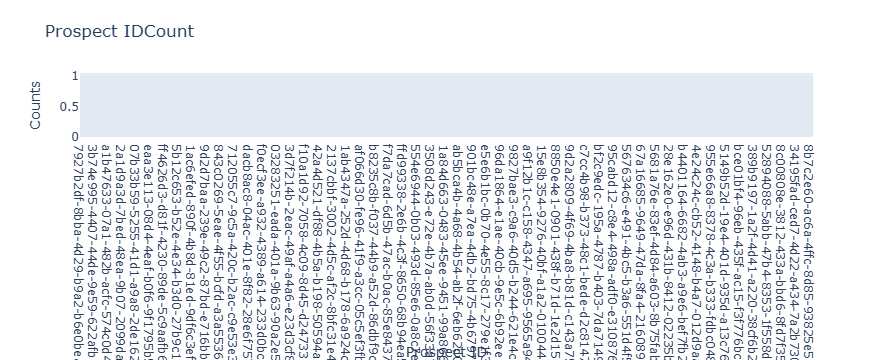

Lead Origin


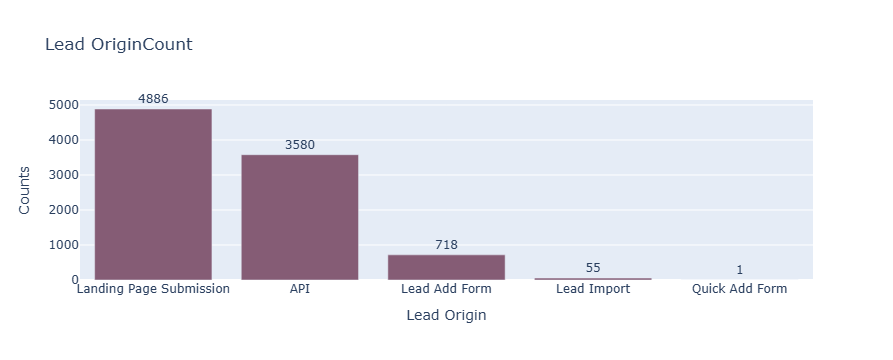

Lead Source


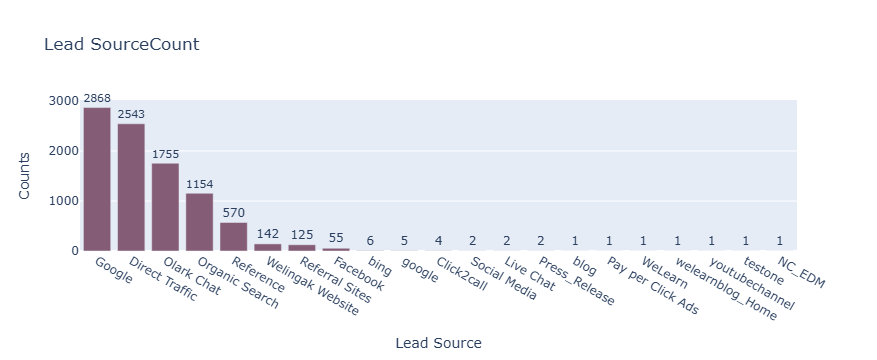

Do Not Email


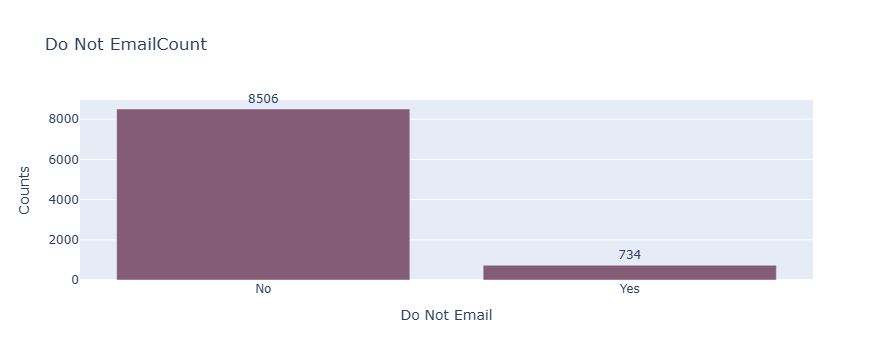

Do Not Call


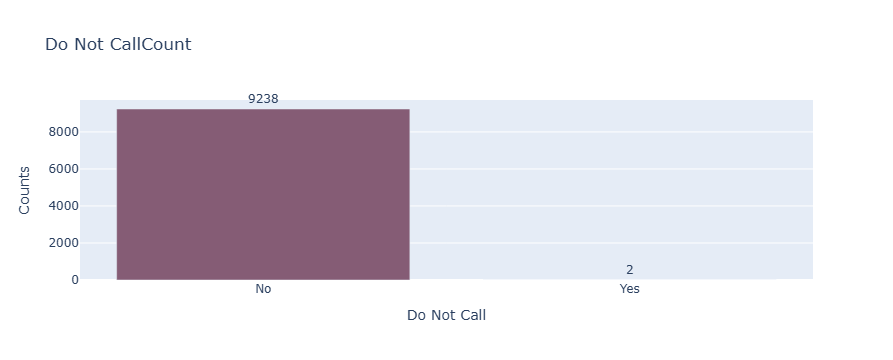

Last Activity


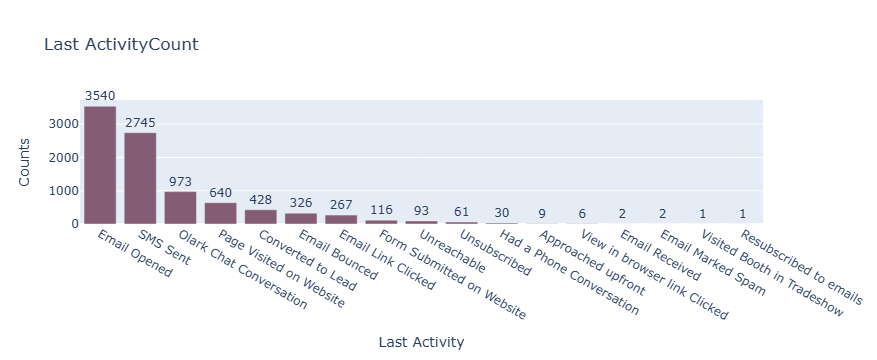

Country


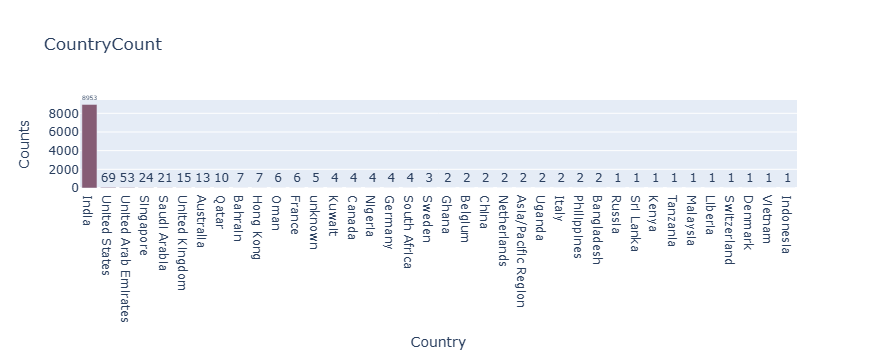

Specialization


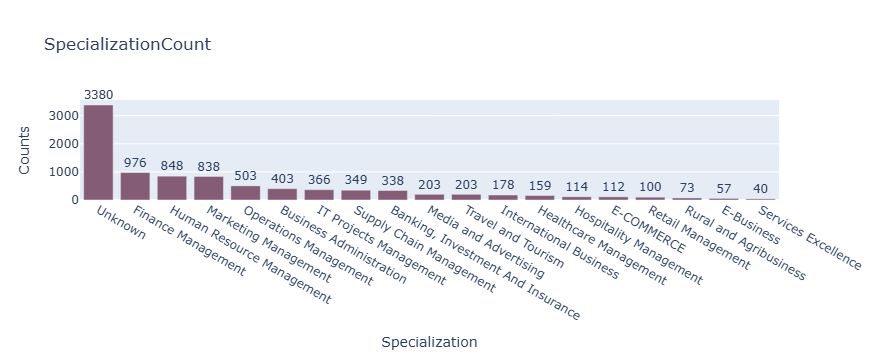

How did you hear about X Education


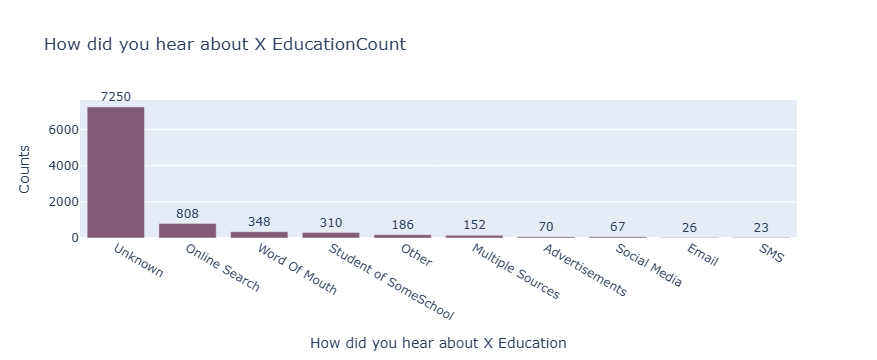

What is your current occupation


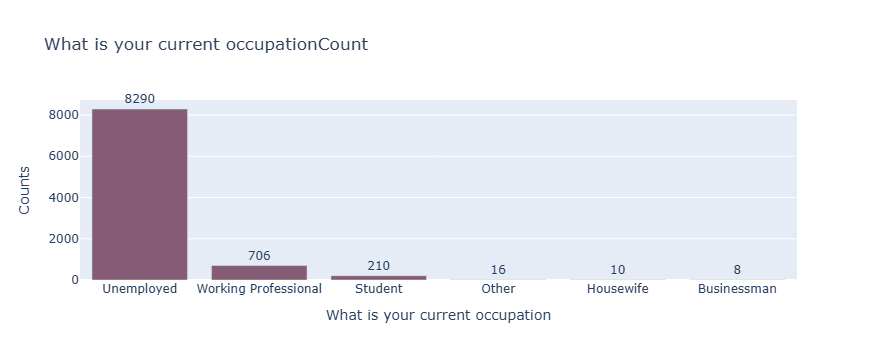

What matters most to you in choosing a course


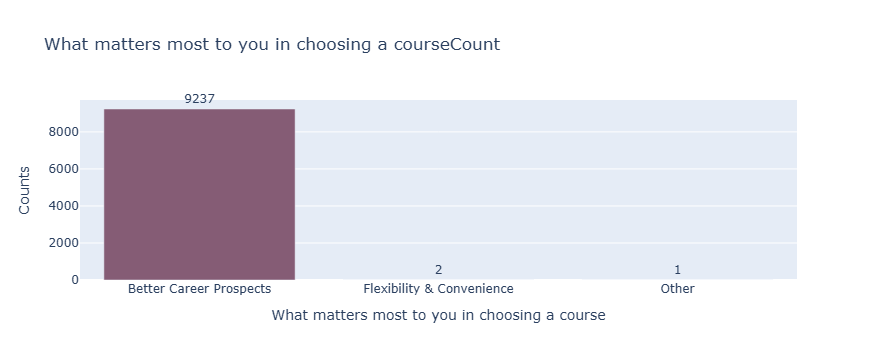

Search


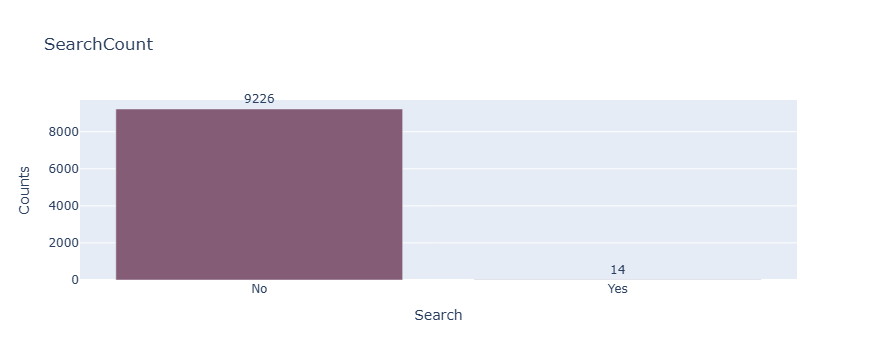

Magazine


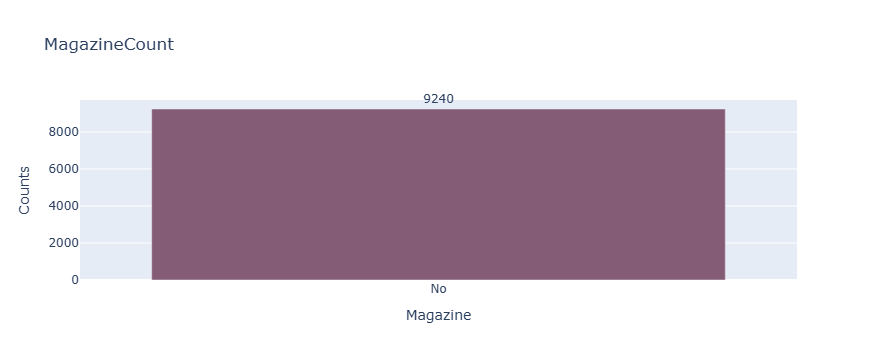

Newspaper Article


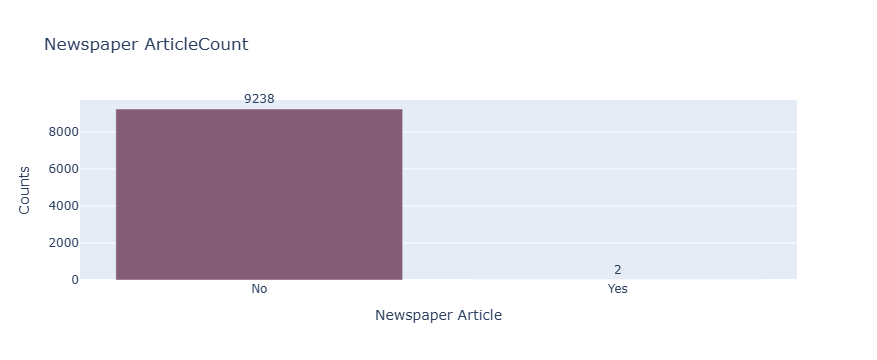

X Education Forums


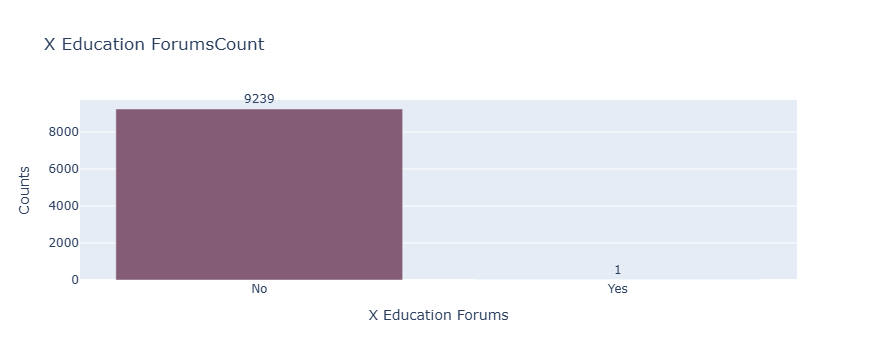

Newspaper


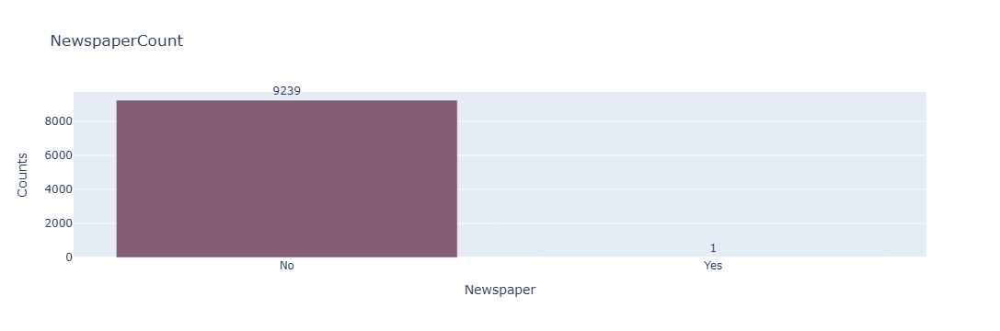

Digital Advertisement


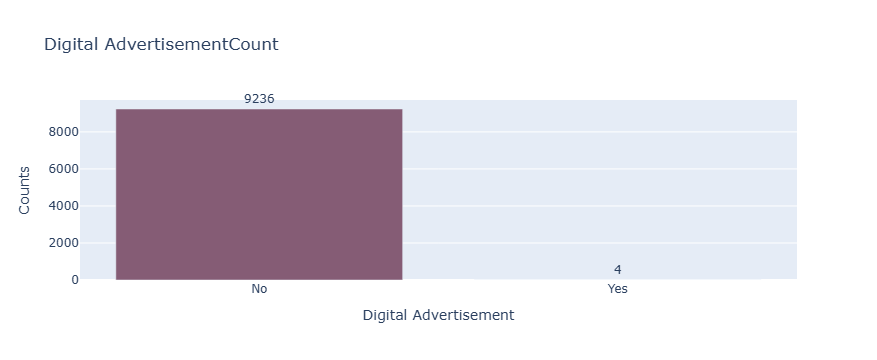

Through Recommendations


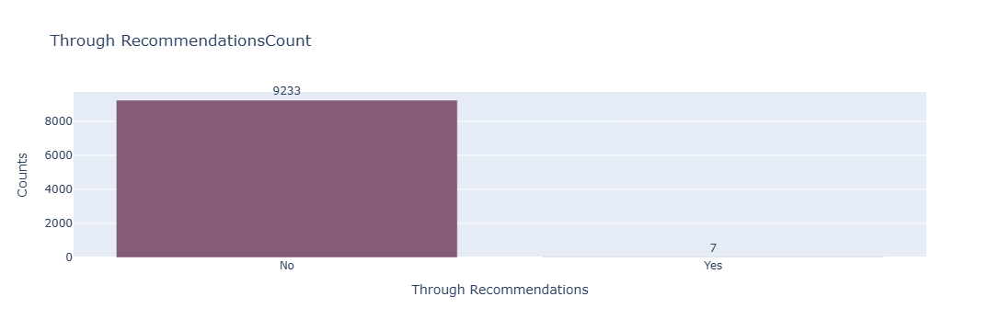

Receive More Updates About Our Courses


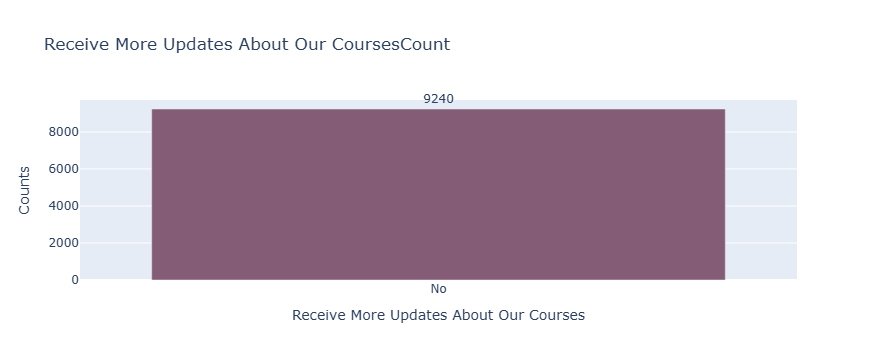

Tags


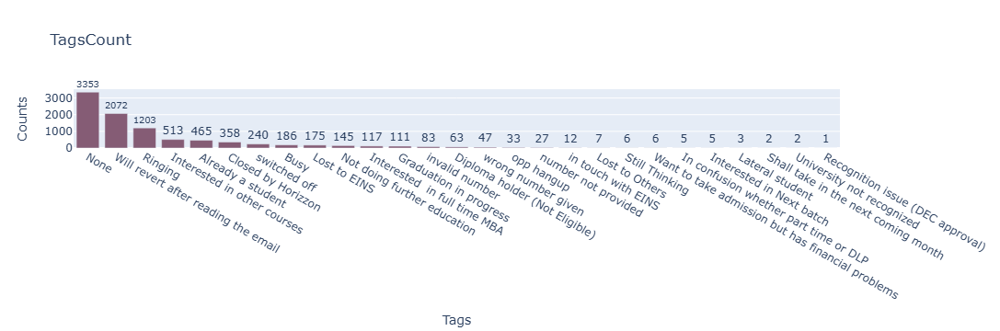

Lead Quality


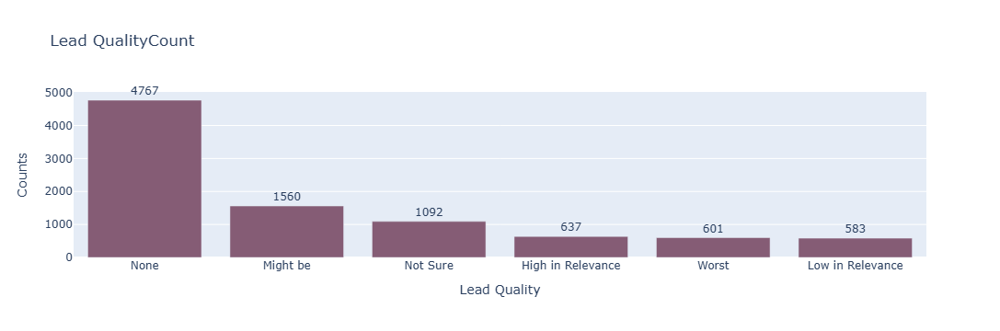

Update me on Supply Chain Content


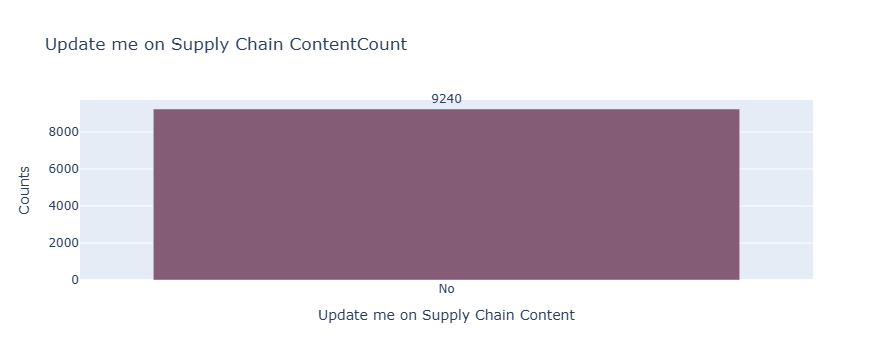

Get updates on DM Content


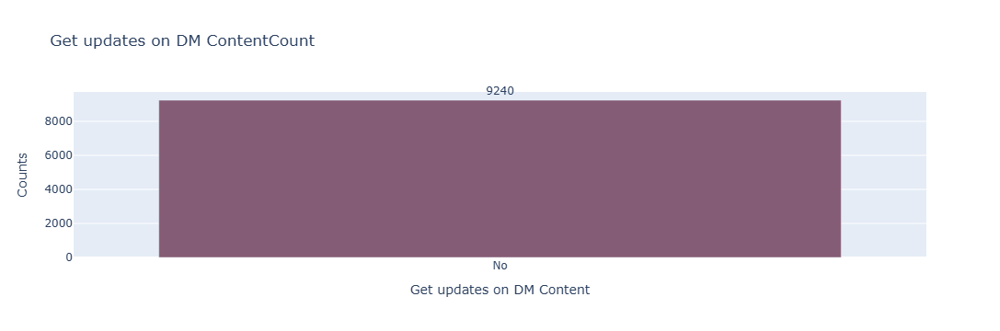

Lead Profile


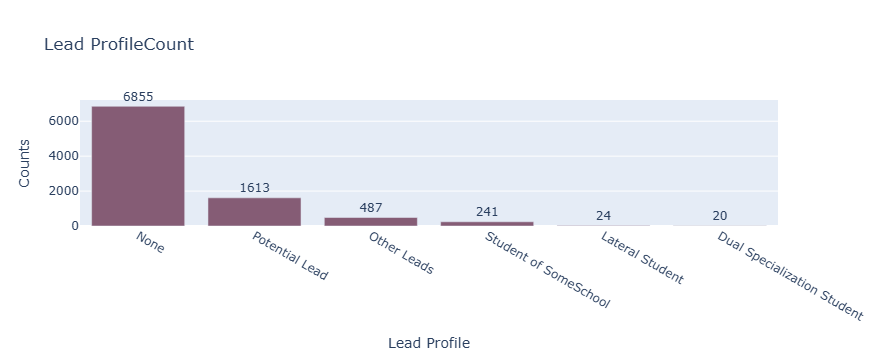

City


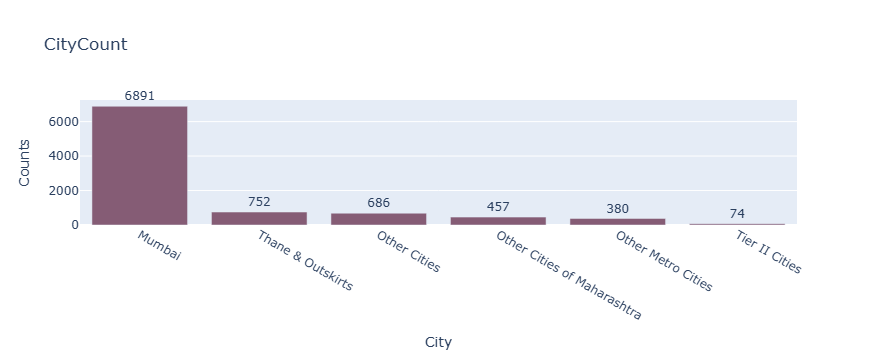

I agree to pay the amount through cheque


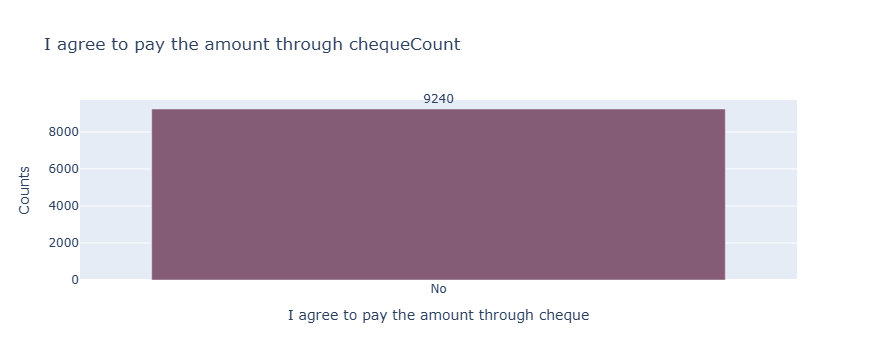

A free copy of Mastering The Interview


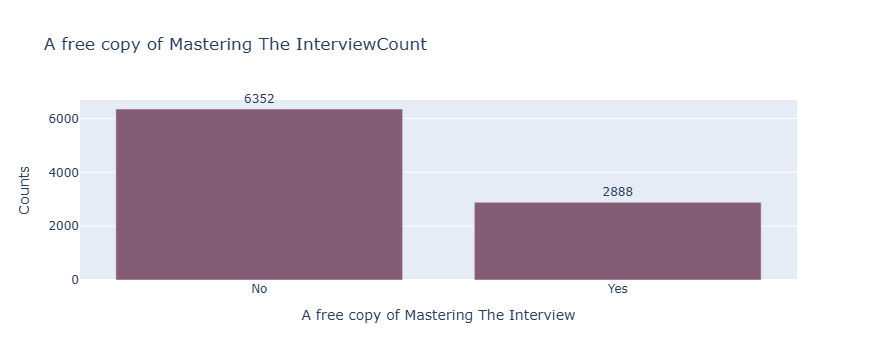

Last Notable Activity


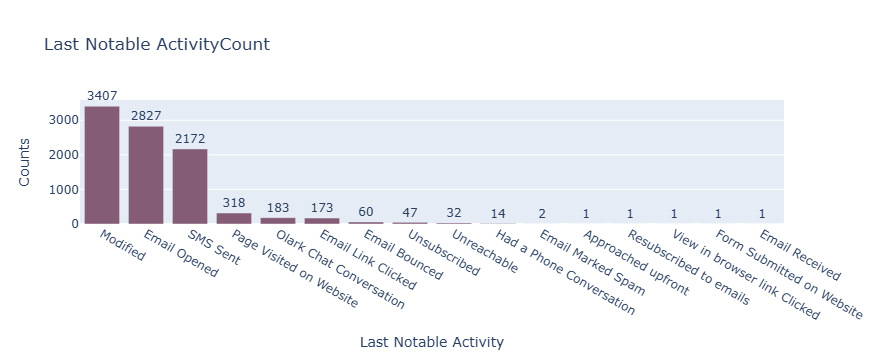

In [9]:
for col in categorical_cols:
    print(col)
    pio.show(bar_plot(data, col, col+' Count'))

Observation and Insight:
- Lead origin: Landing Page Submisiion and API submission are the vast majority of origin. Qick add form is not very much used. 

- Google and Direct Traffic are the leading causes 
- Most people do not want to be contacted proactively  ( do no call do not email)
- India is the main country where leads come from  
- Most people interestd are unemployed

- Most people want 'Better Career options' rather than a job with more freedom

- Vast majority of people haven't seen the ad in any of the listed items

- Nobody wnats to get updates on course content and supply chain content 


Action 
Maybe advertize better accross countries? 
Business action: have better positioned ads. 
Business action: Why nobody wants updates? Are they afraid they will get spam?

Drop columns relating to wheter a customer has seen an ad or not

Drop 'update me' columns 


Lead Origin


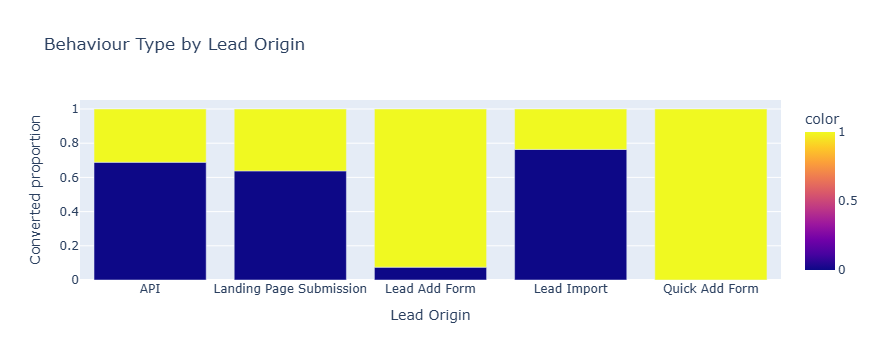

Lead Source


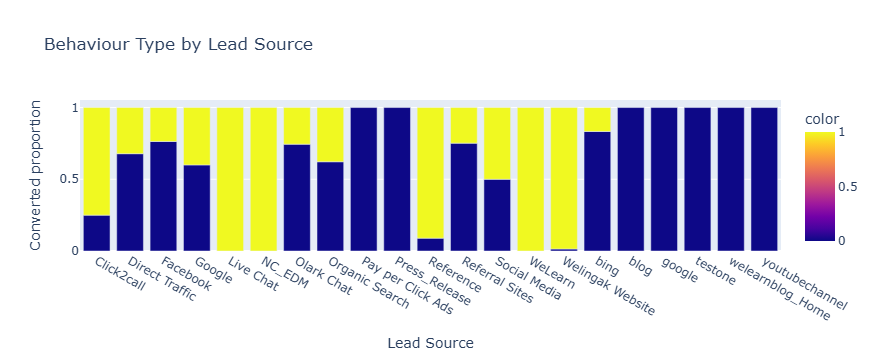

Do Not Email


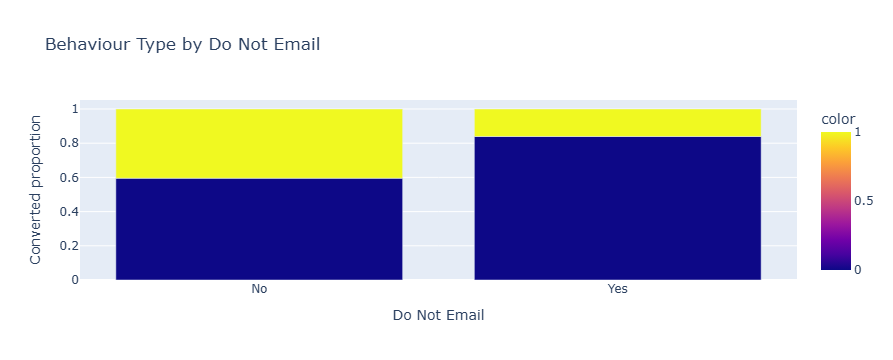

Do Not Call


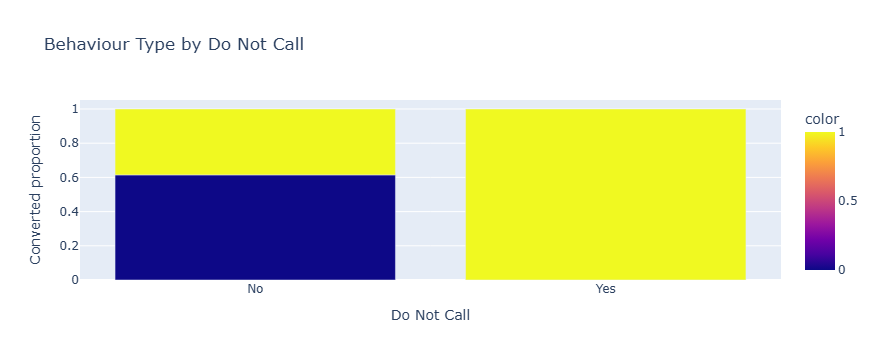

Last Activity


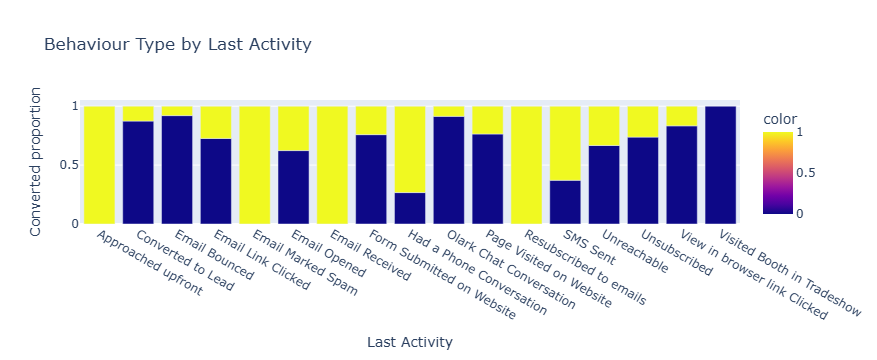

Country


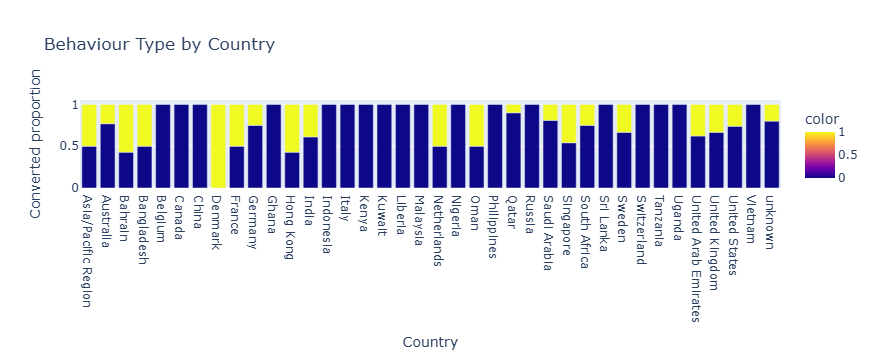

Specialization


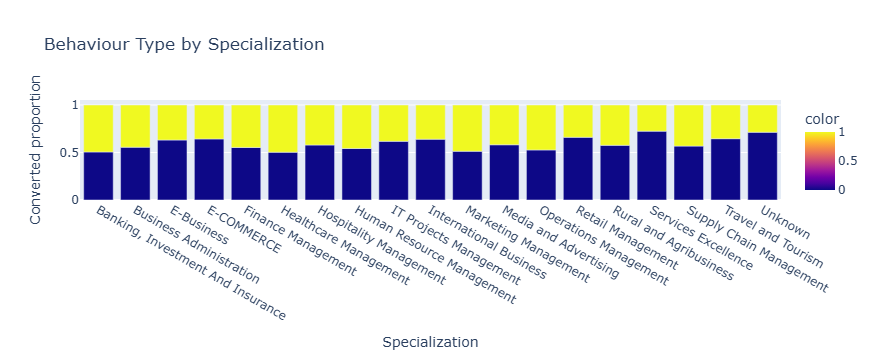

How did you hear about X Education


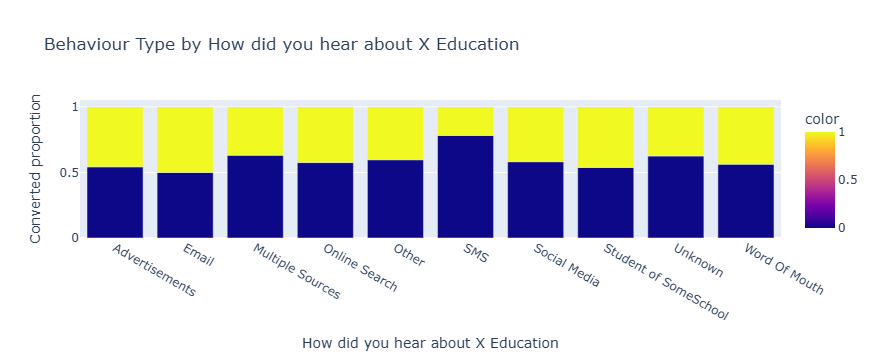

What is your current occupation


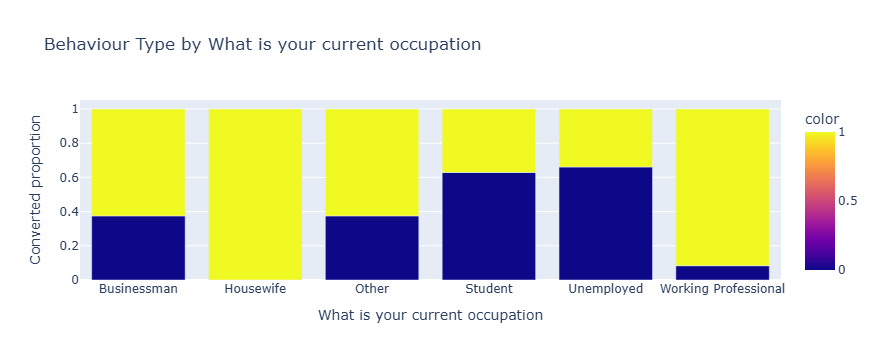

What matters most to you in choosing a course


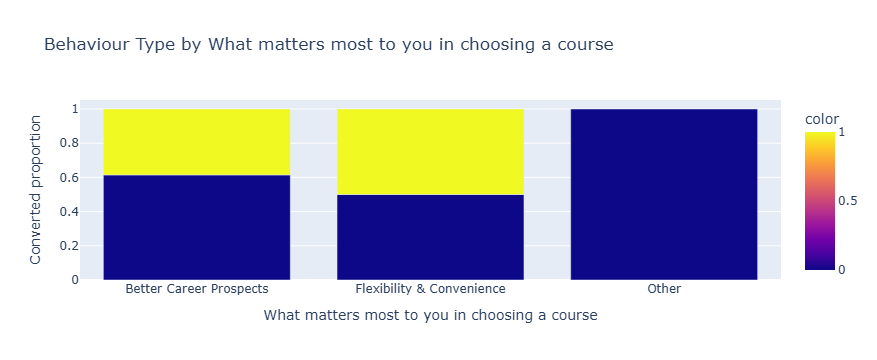

Search


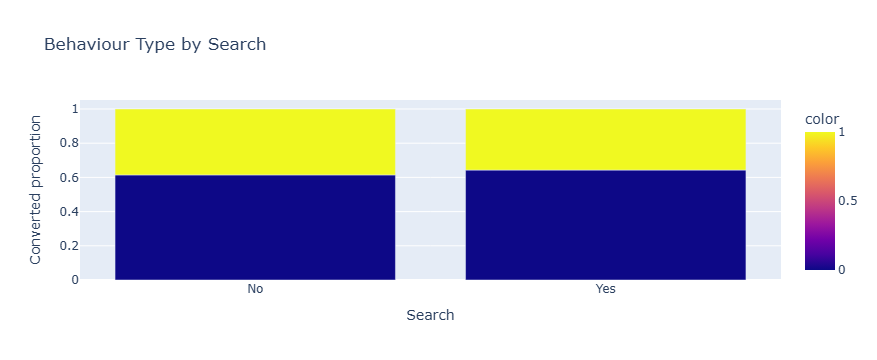

Magazine


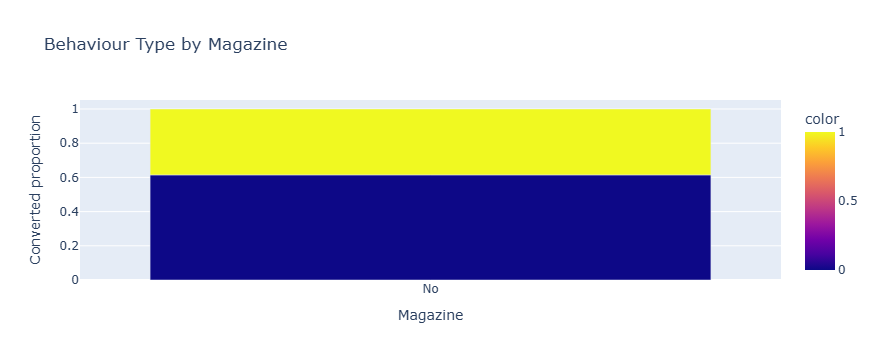

Newspaper Article


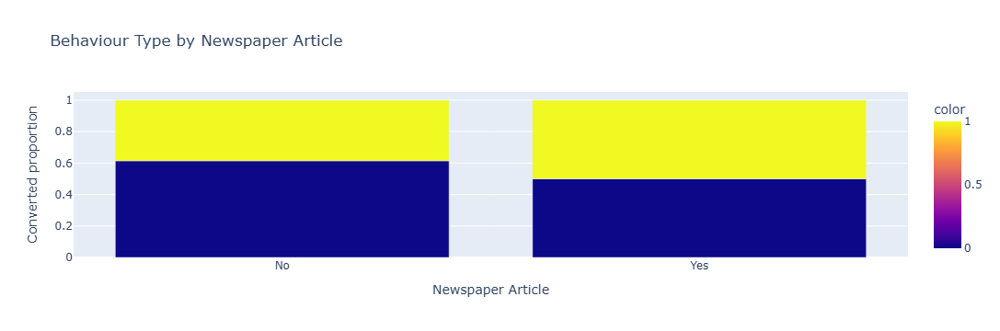

X Education Forums


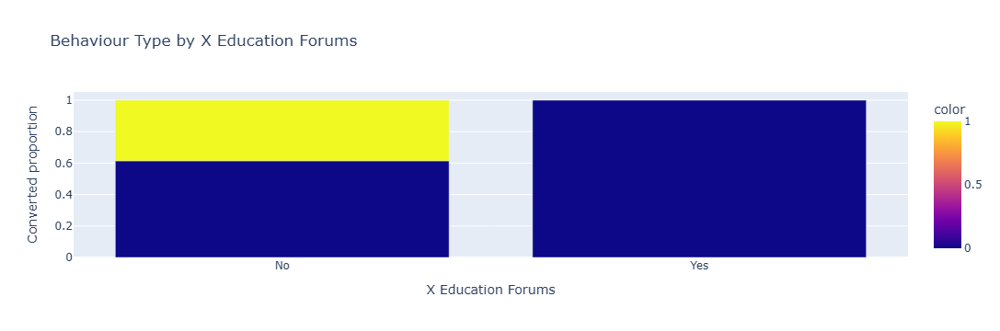

Newspaper


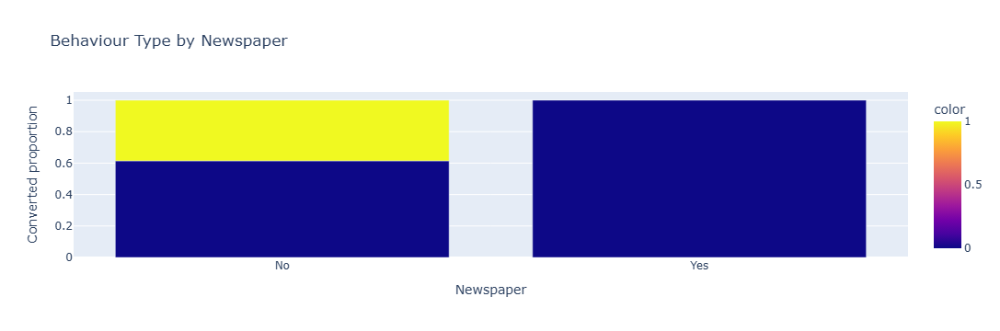

Digital Advertisement


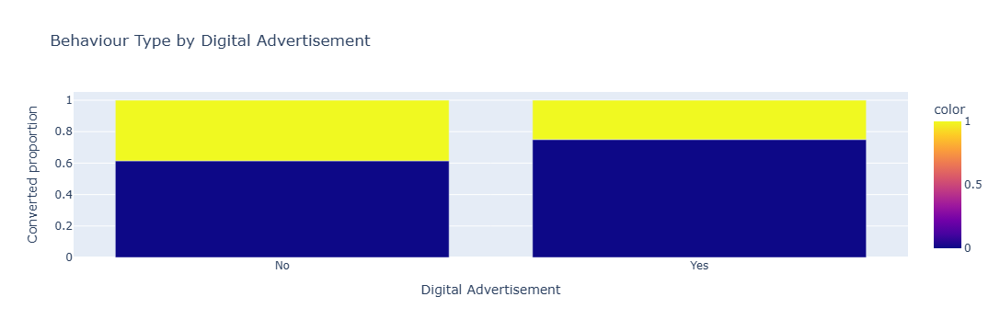

Through Recommendations


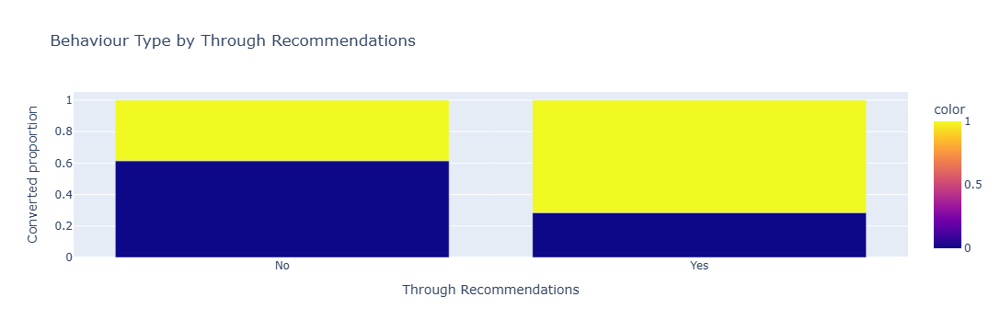

Receive More Updates About Our Courses


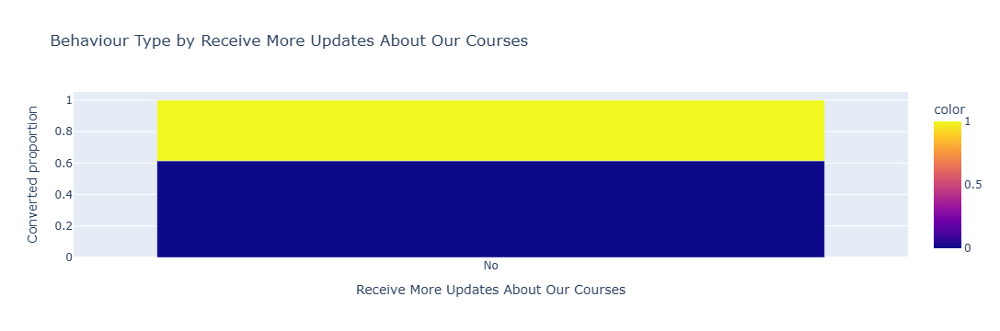

Tags


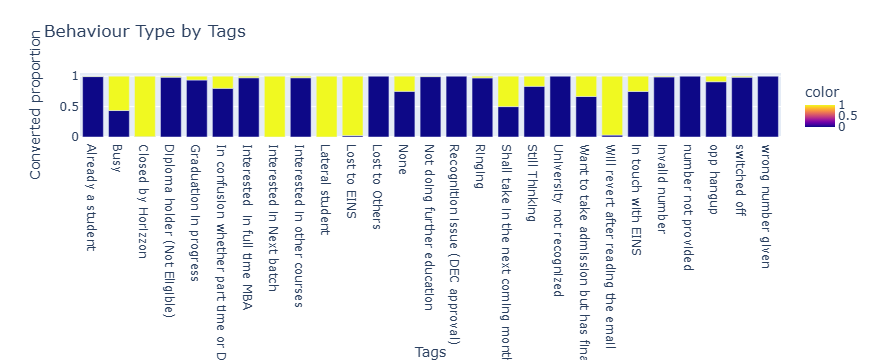

Lead Quality


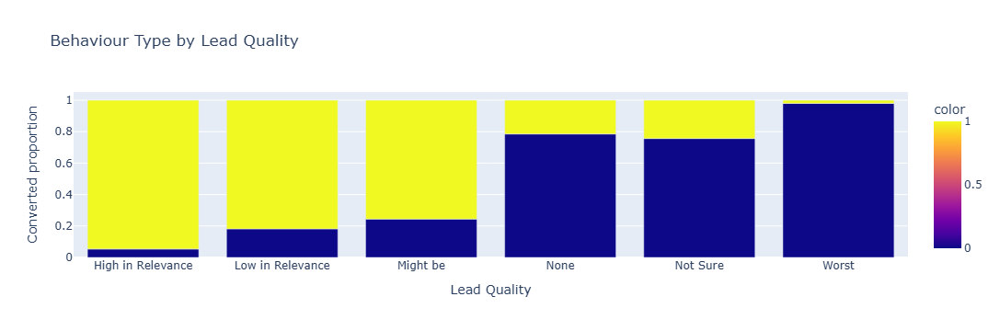

Update me on Supply Chain Content


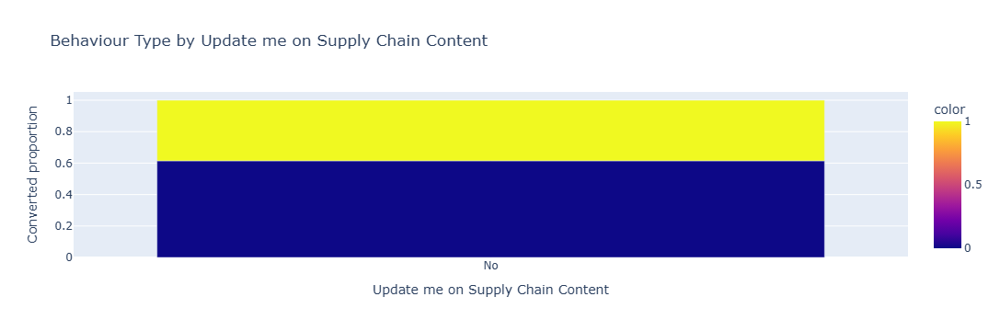

Get updates on DM Content


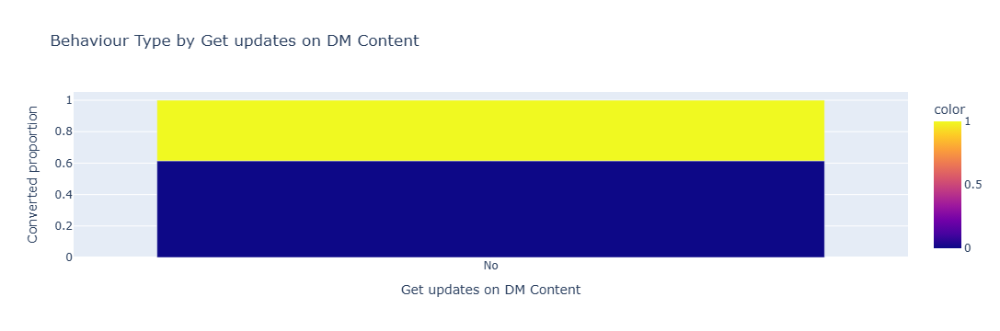

Lead Profile


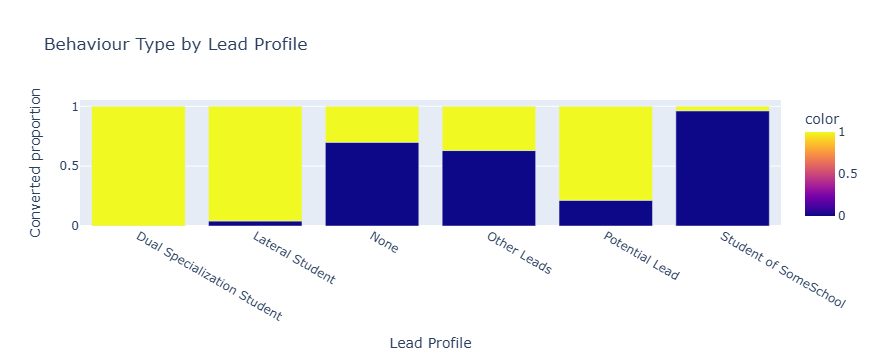

City


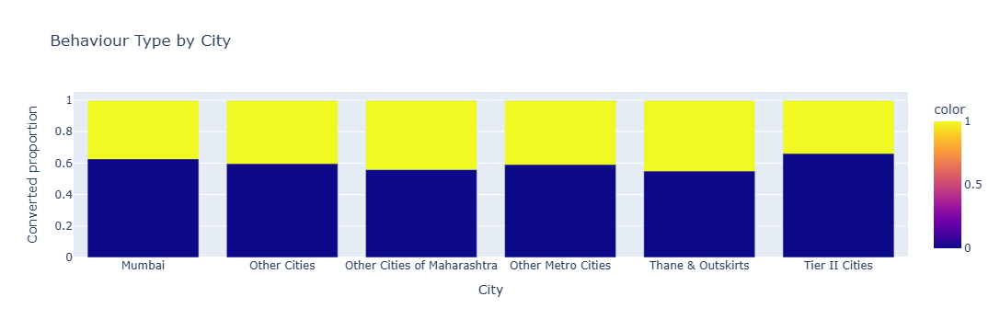

I agree to pay the amount through cheque


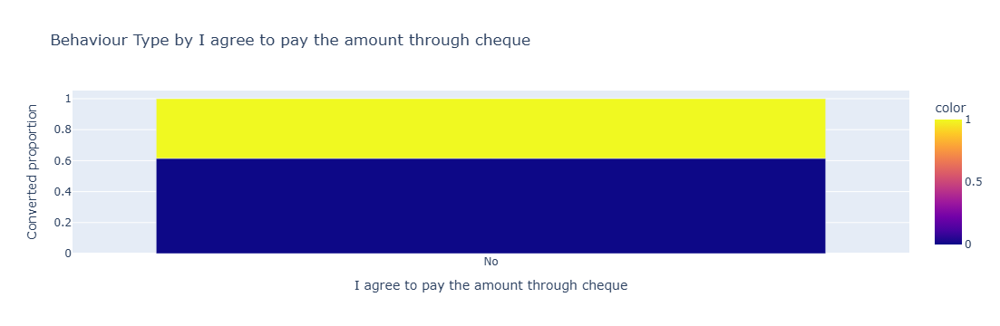

A free copy of Mastering The Interview


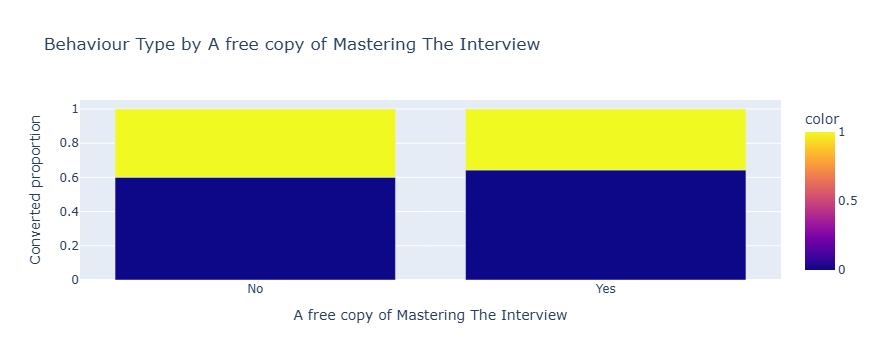

Last Notable Activity


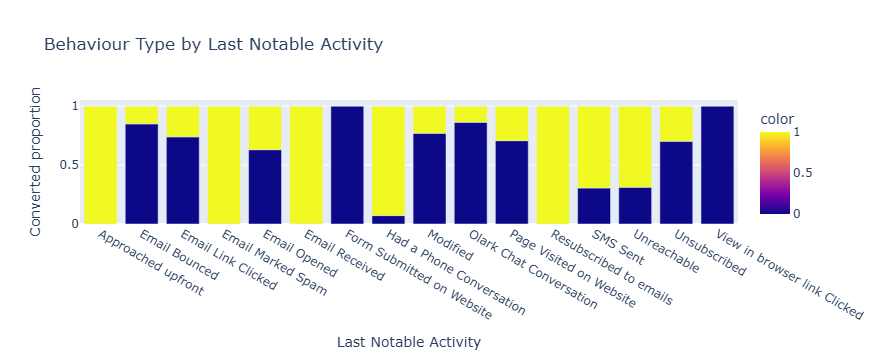

In [12]:
for col in categorical_cols:
    print(col)
    pio.show(proportion_plot(data, col, "Converted", "Behaviour Type by "+ col ))

Observstions and Insights
That are some values in some columns that indicate an almost guranteed conversion. Pleas note that these values are usually not highly frequent for that column. 
Here are the ones that have only 1-2 instances of that values but 100% conversion rate:
- Lead origin: Quick Add Form , Lead Source: Live Chat,We Learn, Do you want a call?: Last activity: Yes , email marked as soal , resuscribed to email, email marked as spam  , country: Denmark

- Lat activity: Approached upfront

- Lar occuoation: housewife and working professional very likely to convert

there are some other where there is almost a 50% change of conversion despite the value in that feature. These features are not very useful. 
Specialization, how'd you hear about us?, better carreer prospects, city, did you see an ad?



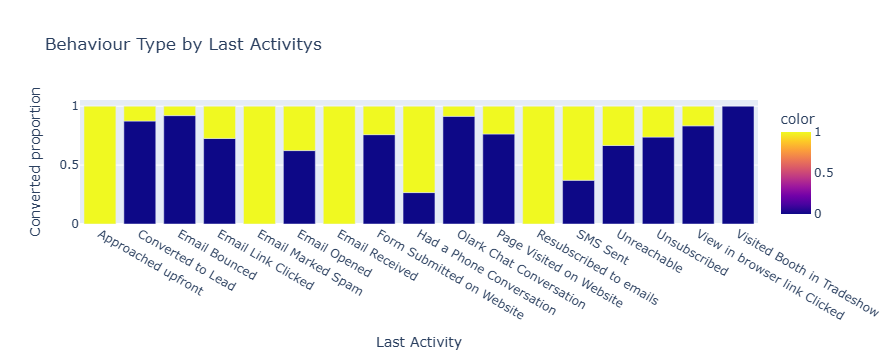

In [19]:
proportion_plot(data, "Last Activity", "Converted", "Behaviour Type by Last Activitys")

hypo: people that are ope for called. get called and then convert

More eager customers conver

messaging in person is more effective than passive marketing 

In [12]:
import polars as pl
import plotly.express as px
import plotly.graph_objects as go

def bar_plot_hue(data: pl.DataFrame, column: str, title: str) -> go.Figure:
    """Creates a plotly barplot from Polars column

    Args:
        data (pl.DataFrame): input dataframe
        column (str): column to plot
        title (str): title for the plot

    Returns:
        go.Figure: resulting barplot as plotly Figure
    """
    # Group data by the specified column and "Converted"
    grouped_data = data.group_by([column, "Converted"]).agg(
        pl.count().alias("counts")
    )

    # Convert the data to lists for Plotly
    x = grouped_data[column].to_list()
    counts = grouped_data["counts"].to_list()
    converted = grouped_data["Converted"].to_list()

    # Create the bar plot
    fig = px.bar(
        x=x,
        y=counts,
        color=converted,  # Use 'Converted' column for hue
        text_auto=True,
        title=title,
        labels={
            "x": column,
            "y": "Counts",
            "color": "Converted"
        },
        color_discrete_sequence=px.colors.qualitative.Antique
    )

    fig.update_traces(
        textfont_size=12, textangle=0, textposition="outside", cliponaxis=False
    )

    return fig


C:\Users\Ilora\AppData\Local\Temp\ipykernel_31020\165729217.py:18: DeprecationWarning: `pl.count()` is deprecated. Please use `pl.len()` instead.
  pl.count().alias("counts")


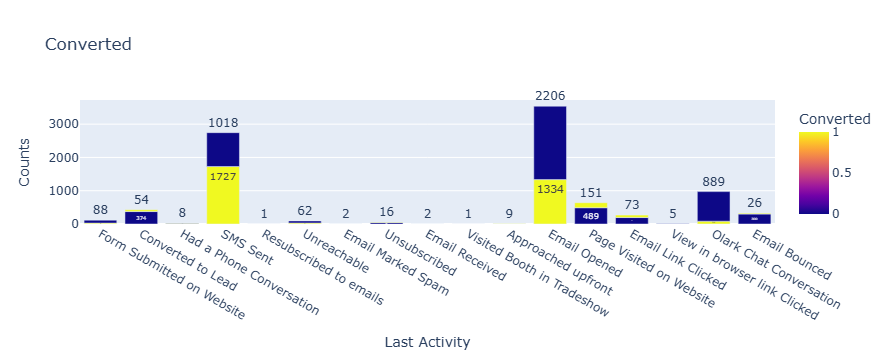

In [13]:
bar_plot_hue(data,"Last Activity", 'Converted')

In [ ]:
Action: 
'What matters most to you in choosing a course','Search',
'Magazine','Newspaper Article','X Education Forums','Newspaper',
'Digital Advertisement','Through Recommendations','Receive More Updates About Our Courses',
'Update me on Supply Chain Content',
'Get updates on DM Content','I agree to pay the amount through cheque',
'A free copy of Mastering The Interview','Country'